# Importing

In [1]:
# importing
import pandas as pd
import numpy as np
# from pandas_profiling import ProfileReport
from matplotlib import pyplot
import matplotlib.pyplot as plt
plt.figure(num=None, figsize=(10, 8), dpi=80, facecolor='w', edgecolor='k')
import seaborn as sns; sns.set() # for plot styling
from pandas.plotting import scatter_matrix
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import preprocessing

import seaborn as sns
import warnings
import plotly.graph_objects as go

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

warnings.filterwarnings('ignore')

# Read the dataset

In [2]:
df = pd.read_csv('purchase_data_exe.csv')
df

,date,customer_id,product_category,payment_method,value [USD],time_on_site [Minutes],clicks_in_site
0,20/11/2018,37077,505,credit,49.53,12.0,8
1,20/11/2018,59173,509,paypal,50.61,25.9,8
2,20/11/2018,41066,507,credit,85.99,34.9,11
3,20/11/2018,50741,506,credit,34.60,16.5,9
4,20/11/2018,53639,515,paypal,266.27,43.1,30
...,...,...,...,...,...,...,...
24994,29/11/2018,33699,513,credit,55.89,45.1,7
24995,29/11/2018,38652,501,paypal,136.27,61.0,11
24996,29/11/2018,30222,504,paypal,427.45,52.8,45
24997,29/11/2018,30183,507,credit,981.81,58.2,76


# Overview before

In [3]:
# overview before cleaning
# axis=0 -> generate for each column
df_before = pd.DataFrame(index=df.columns)
df_before['Datatypes'] = df.dtypes
df_before['Unique'] = df.nunique()
df_before['Max'] = df.max(axis=0)
df_before['Min'] = df.min(axis=0)
df_before['Total'] = df.count(axis=0)
df_before['mean'] = df.median()
df_before['MissingValues'] = df.isnull().any()
df_before['MissingValuesTotal'] = df.isnull().sum()
df_before


,Datatypes,Unique,Max,Min,Total,mean,MissingValues,MissingValuesTotal
date,object,10,29/11/2018,20/11/2018,24999,NaN,False,0
customer_id,int64,19774,59998,10000,24999,35184.00,False,0
product_category,int64,15,515,501,24999,508.00,False,0
payment_method,object,2,paypal,credit,24999,NaN,False,0
value [USD],float64,19027,2177.04,0,24999,136.72,False,0
time_on_site [Minutes],float64,1245,655,2,24999,24.10,False,0
clicks_in_site,int64,117,167,0,24999,11.00,False,0


In [4]:
# convert the date to datetime format
df['date']= pd.to_datetime(df['date']) 
df.info()

#rename the columns
df.rename(columns = {'value [USD]':'total'}, inplace = True)
df.rename(columns = {'time_on_site [Minutes]':'time_on_site'}, inplace = True)

#extract the date column to see the year and month
df['Year'] = pd.DatetimeIndex(df['date']).year
df['Month'] = pd.DatetimeIndex(df['date']).month

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24999 entries, 0 to 24998
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   date                    24999 non-null  datetime64[ns]
 1   customer_id             24999 non-null  int64         
 2   product_category        24999 non-null  int64         
 3   payment_method          24999 non-null  object        
 4   value [USD]             24999 non-null  float64       
 5   time_on_site [Minutes]  24999 non-null  float64       
 6   clicks_in_site          24999 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(3), object(1)
memory usage: 1.3+ MB


In [5]:
df.loc[df.time_on_site < 0]

,date,customer_id,product_category,payment_method,total,time_on_site,clicks_in_site,Year,Month


# Overview after

In [6]:
# overview before cleaning
# axis=0 -> generate for each column
df_after = pd.DataFrame(index=df.columns)
df_after['Datatypes'] = df.dtypes
df_after['Unique'] = df.nunique()
df_after['Max'] = df.max(axis=0)
df_after['Min'] = df.min(axis=0)
df_after['Total'] = df.count(axis=0)
df_after['mean'] = df.median()
df_after['MissingValues'] = df.isnull().any()
df_after['MissingValuesTotal'] = df.isnull().sum()
df_after

,Datatypes,Unique,Max,Min,Total,mean,MissingValues,MissingValuesTotal
date,datetime64[ns],10,2018-11-29 00:00:00,2018-11-20 00:00:00,24999,NaN,False,0
customer_id,int64,19774,59998,10000,24999,35184.00,False,0
product_category,int64,15,515,501,24999,508.00,False,0
payment_method,object,2,paypal,credit,24999,NaN,False,0
total,float64,19027,2177.04,0,24999,136.72,False,0
time_on_site,float64,1245,655,2,24999,24.10,False,0
clicks_in_site,int64,117,167,0,24999,11.00,False,0
Year,int64,1,2018,2018,24999,2018.00,False,0
Month,int64,1,11,11,24999,11.00,False,0


In [7]:
fig = px.violin(df, y=[df.total, df.time_on_site, df.clicks_in_site])
fig.show()

<AxesSubplot:xlabel='customer_id', ylabel='total'>

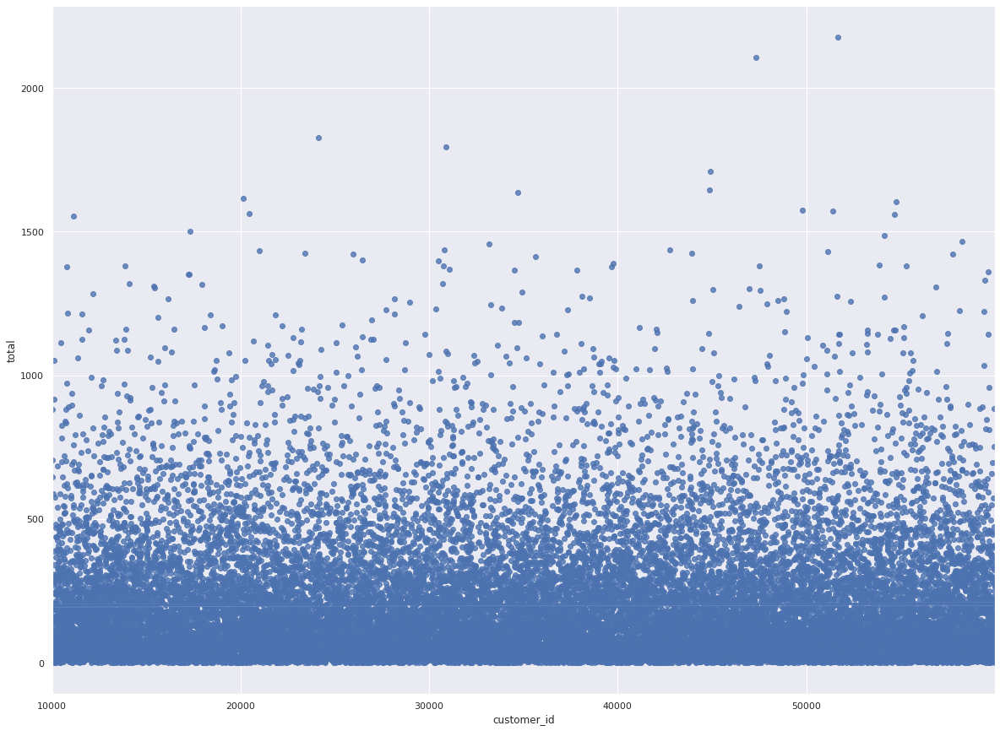

In [8]:
plt.figure(figsize=(20,15))
sns.regplot(x=df.customer_id, y=df.total)

<AxesSubplot:xlabel='total'>

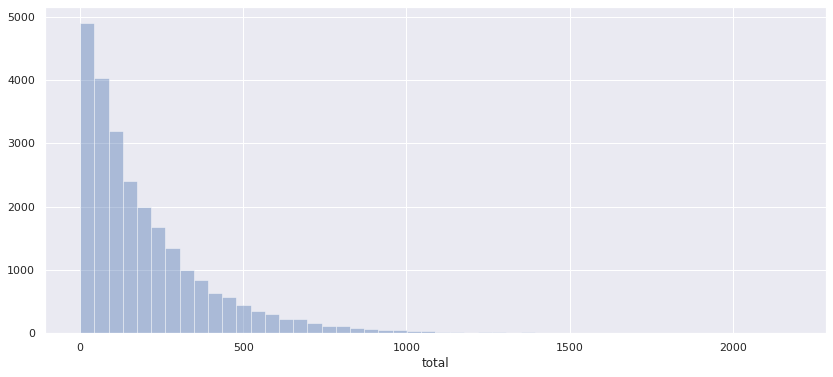

In [9]:
#(histograms) it is used to show continous data(krijohen grupe psh 20-4 dhe ne kete grup vendoset cdo vlere nga 20 ne 30 psh 25 apo 37)
plt.figure(figsize=(14,6))
sns.distplot(a=df.total, kde=False)

In [10]:
#let's drop the clients that have large totals
df = df.drop(df[df.customer_id == 51660].index)
df = df.drop(df[df.customer_id == 47329].index)
print(df.loc[df.total == 2177.04])
print(df.loc[df.total == 2106.99])

Empty DataFrame
Columns: [date, customer_id, product_category, payment_method, total, time_on_site, clicks_in_site, Year, Month]
Index: []
Empty DataFrame
Columns: [date, customer_id, product_category, payment_method, total, time_on_site, clicks_in_site, Year, Month]
Index: []


In [11]:
fig = px.violin(df, y=[df.total])
fig.show()

In [12]:
df

,date,customer_id,product_category,payment_method,total,time_on_site,clicks_in_site,Year,Month
0,2018-11-20,37077,505,credit,49.53,12.0,8,2018,11
1,2018-11-20,59173,509,paypal,50.61,25.9,8,2018,11
2,2018-11-20,41066,507,credit,85.99,34.9,11,2018,11
3,2018-11-20,50741,506,credit,34.60,16.5,9,2018,11
4,2018-11-20,53639,515,paypal,266.27,43.1,30,2018,11
...,...,...,...,...,...,...,...,...,...
24994,2018-11-29,33699,513,credit,55.89,45.1,7,2018,11
24995,2018-11-29,38652,501,paypal,136.27,61.0,11,2018,11
24996,2018-11-29,30222,504,paypal,427.45,52.8,45,2018,11
24997,2018-11-29,30183,507,credit,981.81,58.2,76,2018,11


In [13]:
# Dataset for each month revenue
month_df = df.groupby(['Month'],as_index=False)['total'].sum()
month_df

,Month,total
0,11,5076240.72


# Payment methonds revenue

In [14]:
payment_df = df.groupby(['payment_method'],as_index=False)['total'].sum()
payment_df
payment_df.insert(2, "Percentage", ((payment_df.total/month_df.total[0])*100).round(decimals=2), True) 
payment_df

,payment_method,total,Percentage
0,credit,3037371.01,59.84
1,paypal,2038869.71,40.16


In [15]:
fig = px.pie(payment_df, values='Percentage', names='payment_method', color='payment_method',
             color_discrete_map={'First group':'lightcyan',
                                 'Second group':'cyan',
                                 'Third group':'royalblue',
                                 'Fourth group':'darkblue'},
            )
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(title_text='Payment methonds revenue')
fig.show()

# Each product revenue

In [16]:
product_df = df.groupby(['product_category'],as_index=False)['total'].sum()
product_df
product_df.insert(2, "Percentage", ((product_df.total/month_df.total[0])*100).round(decimals=2), True) 
product_df
# best categiory = 505, worst = 511

,product_category,total,Percentage
0,501,319681.33,6.30
1,502,318939.14,6.28
2,503,344167.09,6.78
3,504,325769.58,6.42
4,505,443451.26,8.74
5,506,347301.76,6.84
6,507,339178.47,6.68
7,508,347132.42,6.84
8,509,313093.63,6.17
9,510,339045.70,6.68


In [17]:
labels = product_df.product_category
values = product_df.Percentage
colors = ['lightslategray',] * 5
# pull is given as a fraction of the pie radius
fig = go.Figure(data=[go.Pie(labels=labels, values=values, pull=[0, 0, 0, 0,0.2])])
fig.update_traces(textposition='inside', textinfo='label')
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="lightcyan",
)
fig.show()

In [18]:
cust_df = df.groupby(['customer_id'],as_index=False)['total'].sum()
cust_df

,customer_id,total
0,10000,694.07
1,10002,164.28
2,10004,186.92
3,10006,156.63
4,10013,705.40
...,...,...
19767,59989,250.11
19768,59991,174.15
19769,59993,270.80
19770,59994,454.15


In [19]:
data = px.data.gapminder()

data_canada = product_df[product_df.total > 0]
fig = px.bar(data_canada, x='product_category', y='total',
             hover_data=['product_category', 'total'], color='total',
             labels={'Total':'Total of product category'}, 
             height=500)
fig.show()

In [20]:
tot = df.loc[df.product_category == 505].groupby(['customer_id'],as_index=False)['total','time_on_site','clicks_in_site'].sum()
tot = tot.sort_values(by=['total'],ascending=False)
tot = tot.sort_values(by=['customer_id'],ascending=False)
tot = tot.head(50)
tot

,customer_id,total,time_on_site,clicks_in_site
2060,59981,125.56,14.9,14
2059,59971,128.98,15.8,17
2058,59957,407.80,32.4,11
2057,59926,32.62,6.2,7
2056,59849,300.75,25.3,22
2055,59803,31.42,28.8,8
2054,59791,298.04,5.5,8
2053,59787,27.23,45.3,7
2052,59712,149.81,15.7,11
2051,59700,45.03,53.0,7


In [21]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=tot.customer_id, y=tot['total'],
                    mode='lines+markers',
                    name='Total'))
fig.add_trace(go.Scatter(x=tot.customer_id, y=tot['time_on_site'],
                    mode='lines+markers',
                    name='Time on site'))
fig.add_trace(go.Scatter(x=tot.customer_id, y=tot.clicks_in_site,
                    mode='lines+markers',
                    name='Clicks in site'))
fig.update_layout(hovermode='x unified')

fig.show()